In [4]:
#Analysis of Mortgage Loans in New York

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
df = pd.read_csv("state_NY.csv")

/var/folders/km/vd961byj21d2vgpgtcvkn3940000gn/T/ipykernel_36612/1305725136.py:1: DtypeWarning: Columns (22,23,24,26,27,28,29,30,31,32,33,38,43,44) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("state_NY.csv")


In [8]:
df.head()

,activity_year,lei,derived_msa-md,state_code,county_code,census_tract,conforming_loan_limit,derived_loan_product_type,derived_dwelling_category,derived_ethnicity,...,denial_reason-2,denial_reason-3,denial_reason-4,tract_population,tract_minority_population_percent,ffiec_msa_md_median_family_income,tract_to_msa_income_percentage,tract_owner_occupied_units,tract_one_to_four_family_homes,tract_median_age_of_housing_units
0,2022,5493000YNV8IX4VD3X12,35614,NY,36005.0,3.600505e+10,C,Conventional:First Lien,Single Family (1-4 Units):Manufactured,Not Hispanic or Latino,...,NaN,NaN,NaN,2142,32.31,99000,109,339,411,70
1,2022,5493006O6Q2F0MR0ZM22,0,NY,NaN,NaN,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Ethnicity Not Available,...,NaN,NaN,NaN,0,0.00,0,0,0,0,0
2,2022,5493006O6Q2F0MR0ZM22,0,NY,NaN,NaN,C,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Ethnicity Not Available,...,NaN,NaN,NaN,0,0.00,0,0,0,0,0
3,2022,5493006O6Q2F0MR0ZM22,0,NY,NaN,NaN,U,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Ethnicity Not Available,...,NaN,NaN,NaN,0,0.00,0,0,0,0,0
4,2022,5493006O6Q2F0MR0ZM22,0,NY,NaN,NaN,U,Conventional:First Lien,Single Family (1-4 Units):Site-Built,Ethnicity Not Available,...,NaN,NaN,NaN,0,0.00,0,0,0,0,0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 548905 entries, 0 to 548904
Data columns (total 99 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   activity_year                             548905 non-null  int64  
 1   lei                                       548905 non-null  object 
 2   derived_msa-md                            548905 non-null  int64  
 3   state_code                                548905 non-null  object 
 4   county_code                               546170 non-null  float64
 5   census_tract                              545678 non-null  float64
 6   conforming_loan_limit                     542121 non-null  object 
 7   derived_loan_product_type                 548905 non-null  object 
 8   derived_dwelling_category                 548905 non-null  object 
 9   derived_ethnicity                         548905 non-null  object 
 10  derived_race        

In [12]:
df.describe()

,activity_year,derived_msa-md,county_code,census_tract,action_taken,purchaser_type,preapproval,loan_type,loan_purpose,lien_status,...,denial_reason-2,denial_reason-3,denial_reason-4,tract_population,tract_minority_population_percent,ffiec_msa_md_median_family_income,tract_to_msa_income_percentage,tract_owner_occupied_units,tract_one_to_four_family_homes,tract_median_age_of_housing_units
count,548905.0,548905.000000,546170.000000,5.456780e+05,548905.000000,548905.000000,548905.000000,548905.000000,548905.000000,548905.000000,...,21822.000000,3870.000000,408.000000,548905.000000,548905.000000,548905.000000,548905.000000,548905.000000,548905.000000,548905.000000
mean,2022.0,37728.963132,36067.149089,3.606729e+10,2.326740,3.624775,1.977045,1.151248,10.772431,1.192013,...,4.611905,5.774677,6.676471,4355.951633,35.207657,105287.507128,115.019315,1086.430601,1389.937102,45.478893
std,0.0,20457.472502,31.373077,5.697364e+07,1.712161,13.556269,0.149760,0.437351,13.833607,0.393884,...,2.779067,2.692355,2.479049,1674.607272,27.663736,24039.540445,51.064993,545.334419,658.512267,23.658732
min,2022.0,0.000000,36001.000000,6.001431e+09,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2022.0,35004.000000,36047.000000,3.604706e+10,1.000000,0.000000,2.000000,1.000000,1.000000,1.000000,...,3.000000,4.000000,5.000000,3160.000000,13.520000,91100.000000,86.000000,667.000000,951.000000,37.000000
50%,2022.0,35614.000000,36065.000000,3.606502e+10,1.000000,0.000000,2.000000,1.000000,2.000000,1.000000,...,4.000000,6.000000,6.000000,4264.000000,25.520000,99000.000000,107.000000,1059.000000,1425.000000,52.000000
75%,2022.0,39100.000000,36091.000000,3.609106e+10,3.000000,1.000000,2.000000,1.000000,31.000000,1.000000,...,7.000000,9.000000,9.000000,5420.000000,48.040000,115700.000000,131.000000,1479.000000,1838.000000,63.000000
max,2022.0,99999.000000,36123.000000,4.820141e+10,8.000000,72.000000,2.000000,4.000000,32.000000,2.000000,...,9.000000,9.000000,9.000000,17222.000000,100.000000,146400.000000,292.000000,2946.000000,4742.000000,80.000000


<Axes: >

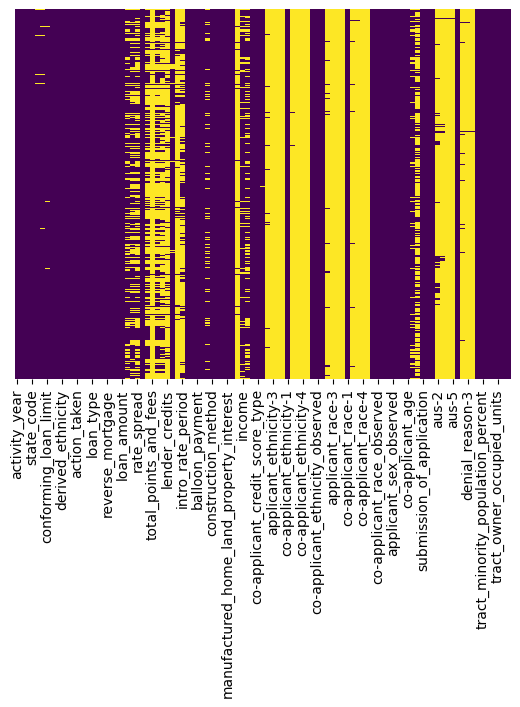

In [14]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

Text(0.5, 1.0, 'Correlation Heatmap')

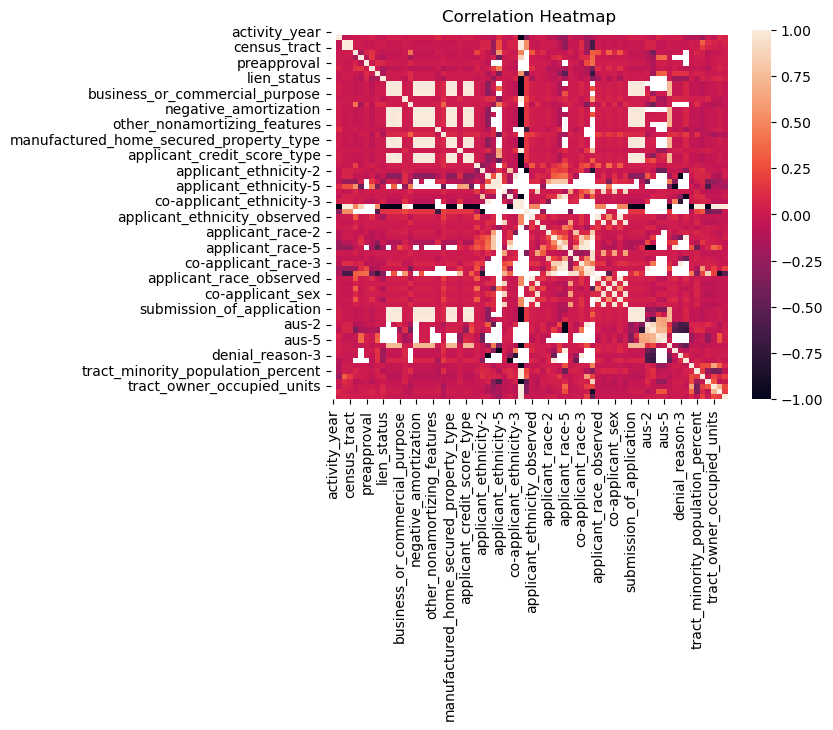

In [21]:
numeric_df = df.select_dtypes(include=['float64','int64'])
corr_matrix = numeric_df.corr()
heatmap = sns.heatmap(corr_matrix,vmin=-1,vmax=1)
heatmap.set_title("Correlation Heatmap")

In [22]:
sns.pairplot(df)

/Users/bochnak/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Axes: >

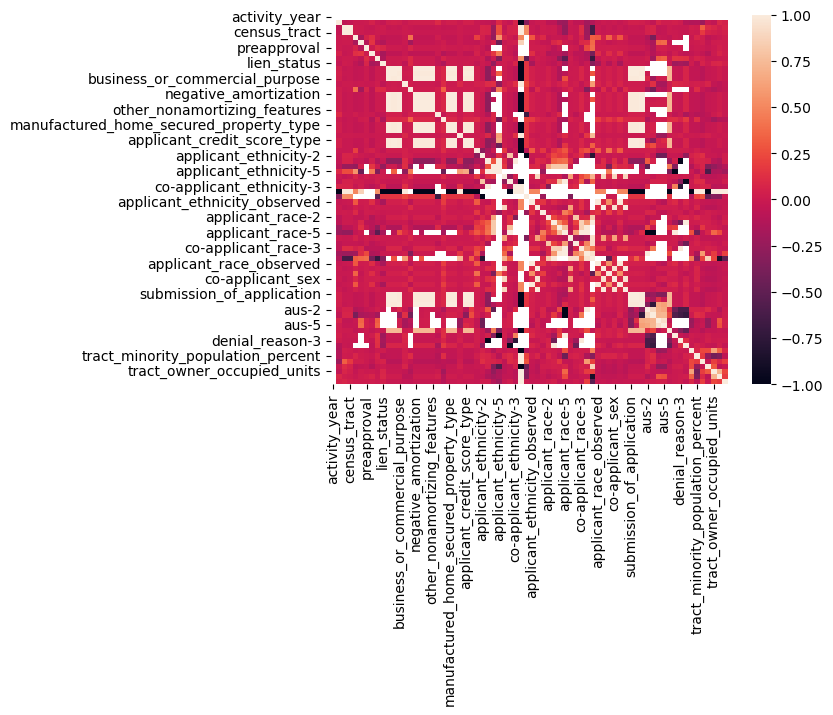